#### Analisis exploratorio de los datos de temperatura

- Datos obtenidos a traves del Notebook WebScraping
- Fuente de datos: https://www.ncei.noaa.gov/access/monitoring/climate-at-a-glance/statewide/time-series

In [1]:
#--BASE--#
import pandas as pd
import seaborn as sns
import warnings
import numpy as np
import datetime
import os
import datetime 

#--VISUALIZACIÓN--#
import matplotlib as mpl
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.figure_factory as ff

#--CONFIGURACIÓN--#
#pd.set_option('display.max_columns', None)
#pd.set_option('display.max_rows', None)
pd.options.display.float_format = '{:.3f}'.format
warnings.filterwarnings('ignore')

## 1. Carga de Datos

In [2]:
#Carga del documento csv con los datos de clima

df = pd.read_csv("../DATOS/Clima/TOTAL_STATES_T.csv")

In [3]:
df

,State,date,Months,Temperature
0,Idaho,1950,January,-8.444
1,Idaho,1951,January,-6.111
2,Idaho,1952,January,-7.333
3,Idaho,1953,January,0.889
4,Idaho,1954,January,-3.056
...,...,...,...,...
42331,Georgia,2017,December,9.611
42332,Georgia,2018,December,10.111
42333,Georgia,2019,December,11.278
42334,Georgia,2020,December,8.000


In [4]:
df['Temperature'].mean()

10.927402210884328

## 2. Análisis de variación en las temperaturas
### 2.1. Análisis Global
- En este primer análisis lo que se busca es tener una idea los valores de las tempretaruas y sus variaciones a lo largo de los años para cada estado. Para el calculo de la temperatura media en cada estado se ha realizado un calculo de medias de todos los años y todos los meses, representandose graficamente.

In [5]:
# Temperatura media de todos los meses y todos los años para cada estado

df_mean = df.groupby(['State']).mean()
df_mean.head()

,date,Temperature
State,,
Alabama,1985.500,17.247
Alaska,1985.500,-2.978
Arizona,1985.500,15.650
Arkansas,1985.500,15.836
California,1985.500,14.564


In [6]:
#se ordenan los valores de mayor a menos

df_mean.sort_values(by = 'Temperature', ascending = False, inplace = True)

In [7]:
#representación de los estados por valor medio de temperatura de mayor a menor

fig = px.bar(df_mean, y = 'Temperature', title = 'Temperatura media de cada estado entre 1950 hasta 2021')
fig.show()

### 2.2. Evolución media anual por estados
En este caso se estudia cual ha sido la evolución de las temperaturas a lo largo de los años para cada estado. Para ello se ha representado la media de los meses para cada año y finalmente la linea de tendencia para conocer si realmente existe un incremento de temperaturas; todo esto se ha hecho para cada uno de los estados de EEUU.

In [8]:
#Se crea una nueva variable igual que a "df_concat", se elimina la columna "Months" y se agrupa por estado y fecha

df_prove = df.copy()
df_prove.drop(['Months'], axis = 1, inplace = True)
df_prove = df_prove.groupby(['State', 'date']).mean()
df_prove.head()

Temperature
State   date             
Alabama 1950       17.287
        1951       17.648
        1952       17.417
        1953       17.644
        1954       17.875

In [9]:
#Se elimina el indice agregado

df_prove = df_prove.reset_index()

In [10]:
#Representación gráfica de la tendencia de las temperaturas en cada estado

#px.bar(df_prove, 'Alabama')
 #fig = px.scatter(df_prove, x = 'date', y = 'retorno', color = 'State')
#fig.show()

fig= px.scatter(df_prove, 
                x = 'date', 
                y='Temperature', 
                color = 'State', 
                opacity=1, 
                trendline='ols', 
                title = 'Evolución anual de la Temperatura en cada estado desde 1950 hasta 2021')
fig.show()

### 2.3. Evolución media anual en EEUU

In [11]:
#Media de todos los meses y estados agrupandolos por meses

df_prove_total = df.copy()
df_prove_total.drop('State', axis = 1, inplace = True)
df_prove_total= df_prove_total.groupby('date').mean()

In [12]:
x

NameError: name 'x' is not defined

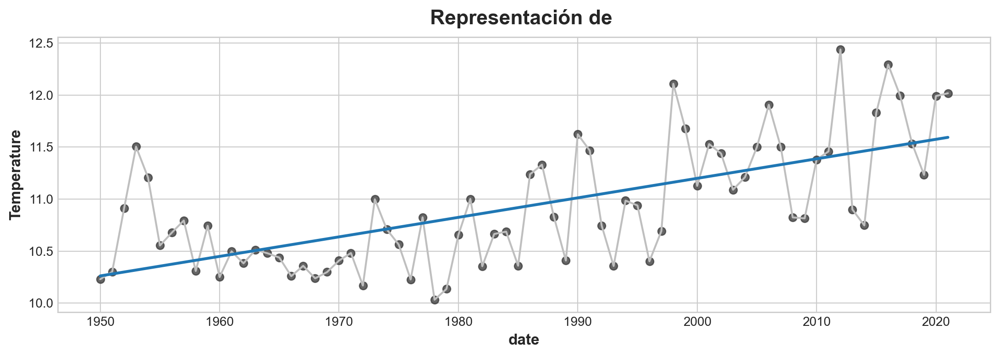

In [ ]:
#Representación grárfica de la evolució de Tª para cada año en EEUU
x = pd.DataFrame(df.groupby('date')['Temperature'].mean())

plt.style.use("seaborn-whitegrid")
plt.rc("figure",
    autolayout=True,
    figsize=(11, 4),
    titlesize=18,
    titleweight='bold')
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=16,
    titlepad=10,
)
%config InlineBackend.figure_format = 'retina'

fig, ax = plt.subplots()
ax.plot(x.index, 'Temperature', data=x, color='0.75')
ax = sns.regplot(x=x.index, y='Temperature', data=x, ci=None, scatter_kws=dict(color='0.25'))
ax.set_title('Evolución de la Temperatura');

### 2.4. Análisis por estaciones
Con el fin de analizar más profundamente la evolución anual de temperaturas y no crear una gran cantidad de gráficas que pueden llegar incluso a confundir, se decide por dividir el analisis en estaciones climáticas. Para ello se han creado cuatro DataFrames, uno por cada estación del año, en el que incluyen las temperaturas en función de los estados, años y meses que hacen referencia a cada estación.

In [ ]:
#Se elimina la columna "date"

df_1 = df.drop('date', axis = 1)

In [ ]:
df_1.head()

,State,Months,Temperature
0,Idaho,January,-8.444
1,Idaho,January,-6.111
2,Idaho,January,-7.333
3,Idaho,January,0.889
4,Idaho,January,-3.056


In [ ]:
#Agrupación por meses y estados

df_1 = df_1.groupby(['Months', 'State']).mean()
df_1

Temperature
Months    State                     
April     Alabama             17.148
          Alaska              -4.410
          Arizona             14.130
          Arkansas            15.958
          California          12.485
...                              ...
September Virginia            19.606
          Washington          14.271
          West_Virginia       14.271
          Wisconsin           14.688
          Wyoming             12.413

[588 rows x 1 columns]

In [ ]:
#Se crean nuevos DataFrames agrupando los estados y las temperaturas por estaciones climáticas

df_verano = df_1.loc[['June', 'July', 'August']].reset_index()
df_primavera = df_1.loc[['March', 'April', 'May']].reset_index()
df_otoño = df_1.loc[['September', 'October', 'November']].reset_index()
df_invierno = df_1.loc[['December', 'January', 'February']].reset_index()

In [ ]:
df_verano.head()

,Months,State,Temperature
0,June,Alabama,25.131
1,June,Alaska,9.833
2,June,Arizona,24.189
3,June,Arkansas,24.801
4,June,California,20.726


In [ ]:
#Se saca la media de cada estación clímatica para cada estado

df_verano = df_verano.groupby(['State']).mean()
df_primavera = df_primavera.groupby(['State']).mean()
df_otoño = df_otoño.groupby(['State']).mean()
df_invierno = df_invierno.groupby(['State']).mean()

In [ ]:
df_verano.head()

,Temperature
State,
Alabama,26.011
Alaska,10.569
Arizona,25.622
Arkansas,25.955
California,22.856


In [ ]:
#Se ordenan los datos por orden descendente

df_verano = df_verano.sort_values(by  = 'Temperature', ascending = False)
df_primavera = df_primavera.sort_values(by  = 'Temperature', ascending = False)
df_otoño = df_otoño.sort_values(by  = 'Temperature', ascending = False)
df_invierno = df_invierno.sort_values(by  = 'Temperature', ascending = False)

In [ ]:
#Representación grafica de la temperatura media para cada estado en el periodo de verano

fig = px.bar(df_verano, y = 'Temperature', title = 'Temperatura media en en verano')
fig.show() 

In [ ]:
#Representación grafica de la temperatura media para cada estado en el periodo de primavera

fig = px.bar(df_primavera, y = 'Temperature', title = 'Temperatura media en primavera')
fig.show() 

In [ ]:
#Representación grafica de la temperatura media para cada estado en el periodo de otoño

fig = px.bar(df_otoño, y = 'Temperature', title = 'Temperatura media en otoño')
fig.show() 

In [ ]:
#Representación grafica de la temperatura media para cada estado en el periodo de invierno

fig = px.bar(df_invierno, y = 'Temperature', title = 'Temperatura media en invierno')
fig.show() 

### 2.5. Analisis de temperatura diferenciando entre mes, año y estado

In [ ]:
#temperaturas mínima y maxima de toda la serie

print(f"Temperatura mínima{df['Temperature'].min()}")
print(f"Temperatura máxima: {df['Temperature'].max()}")

Temperatura mínima-24.88888888888889
Temperatura máxima: 31.77777777777778


In [ ]:
#Evolución de las temperaturas para cada mes, estado y año

df0 = df.copy()
df0.set_index("Months", inplace=True)
df0 = df0.loc[['January', 'February', 'March', 'April', 'May', 'June', 'July','August', 'September', 'October', 'November', 'December' ]]
df0.reset_index(inplace = True)

fig = px.line_polar(df0, r=df0.Temperature, theta=df0.Months, animation_frame= 'date', line_close=True ,color="State")
fig.update_layout(polar=dict(radialaxis=dict(visible=True, range=[-25, 35])),
                  autosize=False,
                  width=1000,
                  height=600,
                  margin=dict(l=50, r=50, b=100, t=100, pad=4), template='seaborn', paper_bgcolor="rgb(234, 234, 242)",
                  legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1))
fig.show()
#reference: https://plotly.com/python/polar-chart/

### 2.6 Evolución de temperatura por año y estado representado en el mapa de EEUU

Para esta representación se ha utilizado un mapa cloropletico de estados unidos a partir de la punción de plotly: "choropleth", para ello es necesario incorporar en el DataFrame los codigos de cada estado.

### Mapa

In [ ]:
#Creación de un diccionario con los codigos de cada estado

columns = {
    'AL':'Alabama',      'AK':'Alaska',       'AZ':'Arizona',
    'AR':'Arkansas',     'CA':'California',   'CO':'Colorado',
    'CT':'Connecticut',  'DE':'Delaware',     'FL':'Florida',
    'GA':'Georgia',      'ID':'Idaho',        'IL':'Illinois',
    'IN':'Indiana',      'IA':'Iowa',         'KS':'Kansas',
    'KY':'Kentucky',     'LA':'Louisiana',    'ME':'Maine',
    'MD':'Maryland',     'MA':'Massachusetts','MI':'Michigan',
    'MN':'Minnesota',    'MS':'Mississippi',  'MO':'Missouri',
    'MT':'Montana',      'NE':'Nebraska',     'NV':'Nevada',
    'NH':'New_Hampshire','NJ':'New_Jersey',   'NM':'New_Mexico',
    'NY':'New_York',     'NC':'North_Carolina','ND':'North_Dakota',
    'OH':'Ohio',         'OK':'Oklahoma',     'OR':'Oregon',
    'PA':'Pennsylvania', 'RI':'Rhode_Island', 'SC':'South_Carolina',
    'SD':'South_Dakota', 'TN':'Tennessee',    'TX':'Texas',
    'UT':'Utah',         'VT':'Vermont',      'VA':'Virginia',
    'WA':'Washington',   'WV':'West_Virginia','WI':'Wisconsin',
    'WY':'Wyoming'
}


In [ ]:
#se crea un dataframe a partir del diccionario

df_code_states = pd.DataFrame([[key, columns[key]] for key in columns.keys()], columns=['code', 'state'])
df_code_states.head()

,code,state
0,AL,Alabama
1,AK,Alaska
2,AZ,Arizona
3,AR,Arkansas
4,CA,California


In [ ]:
#Se integran los codigos en el dataframe

df_map = df.copy()
df_map = df_map.merge(df_code_states, left_on = 'State', right_on='state')
df_map.drop('state', axis = 1, inplace = True)

#df_map = df_concat.copy()
#df_map.drop('Months', axis = 1, inplace = True)
#df_map = df_map.groupby(['State', 'date']).mean()
#df_map = df_map.reset_index()

#df_map['°C'] = ['<=-5' if x<=(-5) else '<=0.0' if (-5.0)<x<=0.0  else '<=5' if 0.0<x<=5 else '<=10' if 5<x<=10 else '<=15' if 10<x<=15 else '<=20' if 15<x<=20 else '>20' if 20<=x<25 else 'None' for x in df_map['Temperature']]

In [ ]:
df_map

,State,date,Months,Temperature,code
0,Idaho,1950,January,-8.444,ID
1,Idaho,1951,January,-6.111,ID
2,Idaho,1952,January,-7.333,ID
3,Idaho,1953,January,0.889,ID
4,Idaho,1954,January,-3.056,ID
...,...,...,...,...,...
42331,Georgia,2017,December,9.611,GA
42332,Georgia,2018,December,10.111,GA
42333,Georgia,2019,December,11.278,GA
42334,Georgia,2020,December,8.000,GA


In [ ]:
#se comprueba que no haya ningun error

df_map.isnull().sum()

State          0
date           0
Months         0
Temperature    0
code           0
dtype: int64

In [ ]:
#Representación del mapa de EEUU y la evolución de la temperatura para cada estado a lo largo del rango de años

fig = px.choropleth(df_map, locations="code", # used plotly express choropleth for animation plot
                    locationmode= "USA-states",
                    color="Temperature", 
                    color_continuous_scale='PuBu',
                    hover_name="State",
                    scope="usa",
                    hover_data=['Temperature'],
                    animation_frame =df_map.date,
                    labels={'Temperature':'The Temperature Change', 'Temperature':'Temperature'},
                    title = 'Temperature Change - 1950 - 2021')
fig.update_layout(height=600)
fig.show()


#reference: https://plotly.com/python/choropleth-maps/